# Coursework 2: Generative Models

## Instructions

Please submit on CATe two zip files:

*CW2.zip* containing the following:
1. A version of this notebook containing your answers. Write your answers in the cells below each question. **Please deliver the notebook including the outputs of the cells below.**
2. Your trained VAE model as *VAE_model.pth*

*GAN.zip* containing your trained Generator and Discriminator: *DCGAN_model_D.pth and DCGAN_model_G.pth*

Please avoid using markdown headings (# ## etc.) as these will affect the ToC. Instead use html headings if you want emphasis.

Similarly to the previous coursework, we recommend that you use Google Colaboratory in order to train the required networks.

TAs will run a testing cell (at the end of this notebook), so you are required to copy your transform and denorm functions to a cell near the bottom of the document (it is demarkated).

<font color="blue">**The deadline for submission is 19:00, Tuesday 23th February, 2021** </font>

## Setting up working environment

For this coursework you, will need to train a large network, therefore we recommend you work with Google Colaboratory, which provides free GPU time. You will need a Google account to do so.

Please log in to your account and go to the following page: https://colab.research.google.com. Then upload this notebook.

For GPU support, go to "Edit" -> "Notebook Settings", and select "Hardware accelerator" as "GPU".

You will need to install pytorch and import some utilities by running the following cell:

In [ ]:
!pip install -q torch torchvision
!git clone -q https://github.com/afspies/icl_dl_cw2_utils
from icl_dl_cw2_utils.utils.plotting import plot_tsne
%load_ext google.colab.data_table

fatal: destination path 'icl_dl_cw2_utils' already exists and is not an empty directory.


In [ ]:
from google.colab import drive
drive.mount('/content/drive') # Outputs will be saved in your google drive

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Introduction

For this coursework, you are asked to implement two commonly used generative models:
1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part you will the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

Each part is worth 50 points. 

The emphasis of both parts lies in understanding how the models behave and learn, however, some points will be available for getting good results with your GAN (though you should not spend too long on this).

# Part 1 - Variational Autoencoder

## Part 1.1 (25 points)
**Your Task:**

a. Implement the VAE architecture with accompanying hyperparameters. Experiment with Feedforward and Convolutional Layers to see which gives better results.

b. Design an appropriate loss function and train the model.


In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/'):
    os.makedirs('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


---
## Part 1.1a: Implement VAE (25 Points)
###Hyper-parameter selection


In [ ]:
# Necessary Hyperparameters
num_epochs = 10
learning_rate = 0.001
batch_size = 128
latent_dim = 16  # Choose a value for the size of the latent space

# Additional Hyperparameters 
beta = 6

# (Optionally) Modify transformations on input

# we could round the inputs here if desired
transform = transforms.Compose([
    transforms.ToTensor(), 
])

# (Optionally) Modify the network's output for visualizing your images
def denorm(x):
    return x

### Data loading


In [ ]:
train_dat = datasets.MNIST("data/", train=True, download=True, transform=transform)
test_dat = datasets.MNIST("data/", train=False, transform=transform)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)

# Don't change 
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, '/content/drive/MyDrive/icl_dl_cw2/CW_VAE/image_original.png')

### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


You will need to define:
* The hyperparameters
* The constructor
* encode
* reparametrize
* decode
* forward



Hints:
- It is common practice to encode the log of the variance, rather than the variance
- You might try using BatchNorm

In [ ]:
# *CODE FOR PART 1.1a IN THIS CELL*
hid_dim = 400

class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        
        self.latent_dim = latent_dim

        #encoding
        self.fc1 = nn.Linear(in_features = 784, out_features = hid_dim)
        self.fc21 = nn.Linear(in_features = hid_dim, out_features = self.latent_dim)
        self.fc22 = nn.Linear(in_features = hid_dim, out_features = self.latent_dim)

        # decoding
        self.fc3 = nn.Linear(in_features = self.latent_dim, out_features = hid_dim)
        self.fc4 = nn.Linear(in_features = hid_dim, out_features = 784)

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def encode(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        h1 = F.relu(self.fc1(x))
        return self.fc21(h1), self.fc22(h1)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def reparametrize(self, mu, logvar):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return mu + eps*std
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    def decode(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        h3 = F.relu(self.fc3(z))
        return torch.sigmoid(self.fc4(h3))
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        mu, logvar = self.encode(x.view(-1, 784))
        z = self.reparametrize(mu, logvar)
        return self.decode(z), mu, logvar
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

model = VAE(latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Total number of parameters is: 648016
VAE(
  (fc1): Linear(in_features=784, out_features=400, bias=True)
  (fc21): Linear(in_features=400, out_features=16, bias=True)
  (fc22): Linear(in_features=400, out_features=16, bias=True)
  (fc3): Linear(in_features=16, out_features=400, bias=True)
  (fc4): Linear(in_features=400, out_features=784, bias=True)
)


**NOTE ON CONVOLUTIONAL VAE:**

I have implemented Convolutional VAE. It resulted in high quality reconstruction images, but the generated image quality was significantly worse than using VAE with linear layers only. Thus, I have decided to use feedforward architecture above as it was implemented first and was already giving satisfactory results. However, the code for the convolutional layer is included below for reference.

In [ ]:
# CONVOLUTIONAL VAE CODE
'''
# *CODE FOR PART 1.1a IN THIS CELL*

num_filters = 16

class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        
        self.latent_dim = latent_dim

        #encoding
        self.lrelu = nn.LeakyReLU(0.2, inplace=True)
        self.enc1 = nn.Conv2d(in_channels=1, out_channels=num_filters, 
                              kernel_size=4, stride=2, padding=1)
        
        self.enc2 = nn.Conv2d(in_channels=num_filters, out_channels=num_filters*2, 
                              kernel_size=4, stride=2, padding=1)
        self.bn_enc2 = nn.BatchNorm2d(num_filters * 2)

        self.enc3 = nn.Conv2d(in_channels=num_filters*2, 
                              out_channels=num_filters*4, kernel_size=4,
                              stride=2, padding=1)
        self.bn_enc3 = nn.BatchNorm2d(num_filters * 4)
        
        self.enc4 = nn.Conv2d(in_channels=num_filters*4, out_channels=64, 
                              kernel_size=4, stride=2)
        
        self.fc1 = nn.Linear(64, 128)
        self.fc_mu = nn.Linear(128, latent_dim)
        self.fc_logvar = nn.Linear(128, latent_dim)
        self.fc2 = nn.Linear(latent_dim, 64)

        # decoding
        self.dec1 = nn.ConvTranspose2d(in_channels=64, 
                                       out_channels=num_filters*8, kernel_size=4)
        self.bn_dec1 = nn.BatchNorm2d(num_filters * 8)
        
        self.dec2 = nn.ConvTranspose2d(in_channels=num_filters*8, 
                                       out_channels=num_filters*4, 
                                       kernel_size=4, stride=2, padding=1)
        self.bn_dec2 = nn.BatchNorm2d(num_filters * 4)
        
        self.dec3 = nn.ConvTranspose2d(in_channels=num_filters*4, 
                                       out_channels=num_filters*2, 
                                       kernel_size=4, stride=2, padding=1)
        self.bn_dec3 = nn.BatchNorm2d(num_filters * 2)
        
        self.dec4 = nn.ConvTranspose2d(in_channels=num_filters*2, 
                                       out_channels=1, kernel_size=4, stride=2, 
                                       padding=1)

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def encode(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        x = self.lrelu(self.enc1(x))
        x = self.lrelu(self.bn_enc2(self.enc2(x)))
        x = self.lrelu(self.bn_enc3(self.enc3(x)))
        x = self.lrelu(self.enc4(x))

        batch, _, _, _ = x.shape
        x = F.adaptive_avg_pool2d(x, 1).reshape(batch, -1)
        hidden = self.fc1(x)
        mu = self.fc_mu(hidden)
        logvar = self.fc_logvar(hidden)

        return mu, logvar
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def reparametrize(self, mu, logvar):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return mu + eps*std
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    def decode(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        x = F.relu(self.bn_dec1(self.dec1(z)))
        x = F.relu(self.bn_dec2(self.dec2(x)))
        x = F.relu(self.bn_dec3(self.dec3(x)))
        return torch.sigmoid(self.dec4(x))
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        mu, logvar = self.encode(x)
        z = self.reparametrize(mu, logvar)
        z = self.fc2(z)
        z = z.view(-1, 64, 1, 1)
        return self.decode(z), mu, logvar
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

model = VAE(latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
'''

--- 

## Part 1.1b: Training the Model (5 Points)

### Defining a Loss
Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In order to implement this loss you will need to think carefully about your model's outputs and the choice of prior.

There are multiple accepted solutions. Explain your design choices based on the assumptions you make regarding the distribution of your data.

* Hint: this refers to the log likelihood as mentioned in the tutorial. Make sure these assumptions reflect on the values of your input data, i.e. depending on your choice you might need to do a simple preprocessing step.

* You are encouraged to experiment with the weighting coefficient $\beta$ and observe how it affects your training

In [ ]:
# *CODE FOR PART 1.1b IN THIS CELL*



def loss_function_VAE(recon_x, x, mu, logvar, beta):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        recon_loss = F.binary_cross_entropy(recon_x, x.view(-1, 784), reduction='sum')

        # The formula for the KLD part of the loss function is described in 
        # the appendix of the VAE paper.
        KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

        return recon_loss + beta*KLD
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

### Additional helper function
################################################################################

def loss_components_VAE(recon_x, x, mu, logvar):
    recon_loss = F.binary_cross_entropy(recon_x, x.view(-1, 784), 
                                        reduction='sum')
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    return recon_loss, KLD

#### End of additional code

# initialize lists to store losses during training 
train_losses = []
train_losses_r = []
train_losses_kl = []

# get test data into a suitable form and also initialize lists in which to
# store the losses
test_data = test_dat.data.float().view(test_dat.data.float().size(0), -1)/255
test_data = test_data.to(device)

test_losses = []
test_losses_r = []
test_losses_kl = []

# and finally train the model
model.train()
for epoch in range(num_epochs):     
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        total_loss = 0
        total_loss_kl = 0
        total_loss_r = 0
        for batch_idx, data in enumerate(loader_train):
            data, _ = data
            data = data.to(device)
            data = data.view(data.size(0), -1)
            optimizer.zero_grad()
            recon_batch, mu, logvar = model(data)
            loss = loss_function_VAE(recon_batch, data, mu, logvar, beta)
            r_loss, kl_loss = loss_components_VAE(recon_batch, data, mu, logvar)
            total_loss_kl += kl_loss
            total_loss_r += r_loss
            loss.backward()
            total_loss += loss.item()
            optimizer.step()

        # keep track of training losses
        train_losses.append(total_loss/len(loader_train.dataset))
        train_losses_kl.append(total_loss_kl/len(loader_train.dataset))
        train_losses_r.append(total_loss_r/len(loader_train.dataset))

        # also evaluate the loss on the test set
        recon_batch_test, mu_test, logvar_test = model(test_data)
        r_loss_test, kl_loss_test = loss_components_VAE(recon_batch_test, 
                                                       test_data, mu_test, 
                                                       logvar_test)
        test_loss = r_loss_test.item() + beta * kl_loss_test.item()
        # add losses to their respective lists
        test_losses.append(test_loss/len(test_data))
        test_losses_kl.append(kl_loss_test.item()/len(test_data))
        test_losses_r.append(r_loss_test.item()/len(test_data))

        print('====> Epoch: {} Average loss: {:.4f}'.format(epoch, total_loss / len(loader_train.dataset)))
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
        # save the model
        if epoch == num_epochs - 1:
            with torch.no_grad():
                torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                    '/content/drive/MyDrive/icl_dl_cw2/CW_VAE/VAE_model.pth')

====> Epoch: 0 Average loss: 201.3403
====> Epoch: 1 Average loss: 176.8553
====> Epoch: 2 Average loss: 172.2011
====> Epoch: 3 Average loss: 170.2176
====> Epoch: 4 Average loss: 168.9354
====> Epoch: 5 Average loss: 168.0945
====> Epoch: 6 Average loss: 167.4304
====> Epoch: 7 Average loss: 166.8140
====> Epoch: 8 Average loss: 166.1577
====> Epoch: 9 Average loss: 165.7313


### Loss Explanation
Explain your choice of loss and how this relates to:

* The VAE Prior
* The output data domain
* Disentanglement in the latent space

**YOUR ANSWER**

The Beta-VAE loss function (described above) consists of two parts, a reconstruction term and a ragularisation term. The reconstruction term aims to make the reconstructed images as close to the original ones as possible, and the regulariastion term tries to make sure the latent space is continuous and complete. The latter also prevents overfitting in the model and enables content generation.
Here, the reconstruction term is chosen to be the Binary Cross-Entropy loss and the regularisation term is given by the Kullback Lieblers (KL) Divergence. The Binary Cross-Entropy loss is applicable here given that we can easily transform our inputs to be in the [0,1] range (by simply dividing by 255). Note that in a VAE, the input and output data domains are the same. Further, by inspecting the original images, we can see that most of the pixel values are very close to either 0 or 1. We could round all the values so the input representation is fully binary, but better results were achieved without this transformation. The KL Divergence term penalizes the model for deviating from a standard Gaussian distribution in the latent space representation, i.e. tries to keep the approximate posterior distribution similar to the prior distribution. [1]

Minimizing these two terms combined during the training process ensures a good trade-off between the quality of reconstruction and favourable properties of the latent space for generating new images. The parameter beta further allows us to adjust how much weight we give to each of the two parameters.

Choosing beta > 1 gives more weight to the regularisation parameter, i.e. more weight to feature disentanglement in the latent space. On the other hand, a beta < 1 favours the reconstruction term, leading to more exact image reconstruction. In the final model, beta = 2 has been selected.

[1] Kingma & Welling, 2013, Auto-Encoding Variational Bayes https://arxiv.org/pdf/1312.6114.pdf

<h2>Part 1.2 (9 points)</h2>

a. Plot your loss curves

b. Show reconstructions and samples

c. Discuss your results from parts (a) and (b)

## Part 1.2a: Loss Curves (3 Points)
Plot your loss curves (6 in total, 3 for the training set and 3 for the test set): total loss, reconstruction log likelihood loss, KL loss (x-axis: epochs, y-axis: loss). If you experimented with different values of $\beta$, you may wish to display multiple plots (worth 1 point).

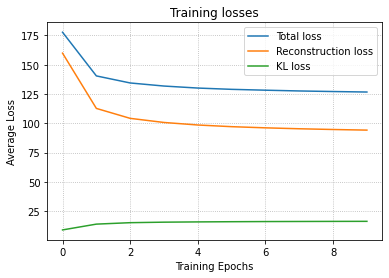

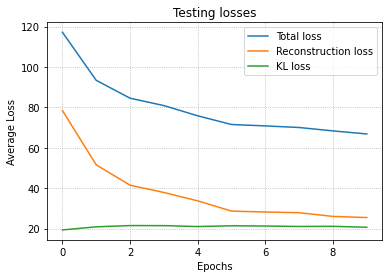

In [ ]:
# *CODE FOR PART 1.2a IN THIS CELL*

# initialize x axis labels
x = list(range(num_epochs))

# Plot for training data
plt.plot(x, train_losses, label = "Total loss")
plt.plot(x, train_losses_r, label = "Reconstruction loss")
plt.plot(x, train_losses_kl, label = "KL loss")
plt.legend()
plt.xlabel("Training Epochs")
plt.ylabel("Average Loss")
plt.title("Training losses")
plt.grid(True, which="major", linestyle="dotted")
plt.show()

# Plot for testing data

plt.plot(x, test_losses, label = "Total loss")
plt.plot(x, test_losses_r, label = "Reconstruction loss")
plt.plot(x, test_losses_kl, label = "KL loss")
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Average Loss")
plt.title("Testing losses")
plt.grid(True, which="major", linestyle="dotted")
plt.show()


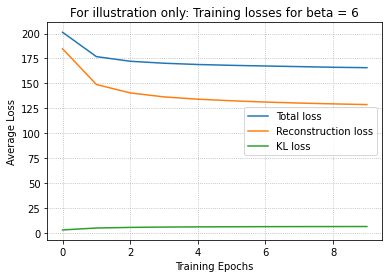

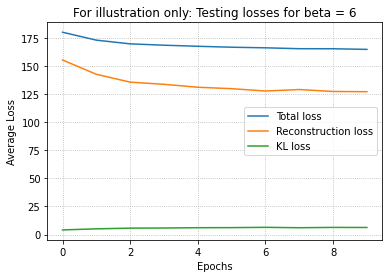

In [ ]:
# *ADDITIONAL CODE FOR PART 1.2a IN THIS CELL*

# The code is commented out because a different than the final model setting 
# has been used to make this visualization

'''
# initialize x axis labels
x = list(range(num_epochs))

# Plot for training data
plt.plot(x, train_losses, label = "Total loss")
plt.plot(x, train_losses_r, label = "Reconstruction loss")
plt.plot(x, train_losses_kl, label = "KL loss")
plt.legend()
plt.xlabel("Training Epochs")
plt.ylabel("Average Loss")
plt.title("For illustration only: Training losses for beta = 6")
plt.grid(True, which="major", linestyle="dotted")
plt.show()

# Plot for testing data

plt.plot(x, test_losses, label = "Total loss")
plt.plot(x, test_losses_r, label = "Reconstruction loss")
plt.plot(x, test_losses_kl, label = "KL loss")
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Average Loss")
plt.title("For illustration only: Testing losses for beta = 6")
plt.grid(True, which="major", linestyle="dotted")
plt.show()
'''

## Part 1.2b: Samples and Reconstructions (6 Points)
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples. Most of the code for this part is provided. You only need to call the forward pass of the model for the given inputs (might vary depending on your implementation).

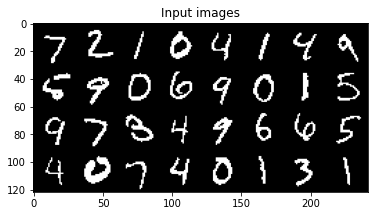

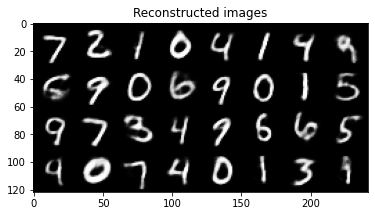

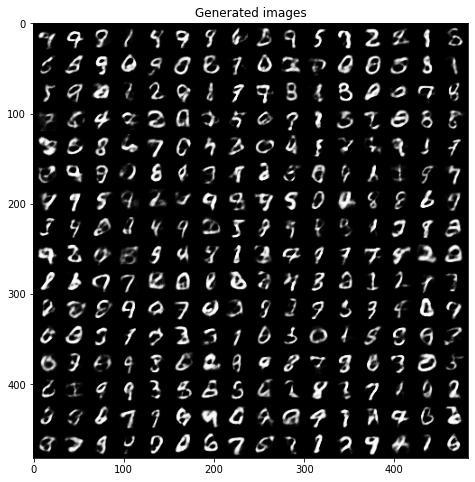

In [ ]:
# *CODE FOR PART 1.2b IN THIS CELL*

# load the model
#print('Input images')
#print('-'*50)

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[0:32, :, :, :]
# visualize the original images of the last batch of the test set
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.title('Input images')
show(img)

#print('Reconstructed images')
#print('-'*50)
with torch.no_grad():
    # visualize the reconstructed images of the last batch of test set
    
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    #recon_batch, mu, logvar = model(fixed_input.view(fixed_input.size(0),-1).to(device))
    #recon_batch = recon_batch.view(fixed_input.size(0), -1, 28, 28)
    recon_batch = model(fixed_input.view(fixed_input.size(0),-1).to(device))[0].detach()
    recon_batch = recon_batch.view(fixed_input.size(0), -1, 28, 28)
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure()
    plt.title('Reconstructed images')
    show(recon_batch)

#print('Generated Images')  
#print('-'*50)
model.eval()
n_samples = 256
z = torch.randn(n_samples,latent_dim).to(device)
with torch.no_grad():
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    samples = model.decode(z)  
    samples = samples.view(samples.size(0), -1, 28, 28)
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    plt.title('Generated images')
    show(samples)



### Discussion
Provide a brief analysis of your loss curves and reconstructions: 
* What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)?
* Can you intuitively explain if this behaviour is desirable? Have you observed posterior collapse during traing (i.e. when the KL is too small during the early stages of training)? 
    * If yes, how did you mitigate it? How did this phenomenon reflect on your output samples?
    * If no, why do you think that is?

**YOUR ANSWER**

In the loss curve plots for the training data, we can see that the total loss is decreasing, which is the most important. Further, while the trend in the reconstruction loss is similar to the overall one, we can see that the KLD component of the total loss is mildly increasing. The trends are similar for the test set loss curves. The total test loss decreasing over time suggests that the network is not overfitting, which is further supported by the visualized sample of reconstructed images from the test set and generated images (both reconstruction and generation work reasonably well).

The total loss decreasing in both the training \& test set is desirable (this is intuitive), because this means the overall network performance is getting better. A similar argument is valid for the reconstruction loss decreasing, as this simply means the network is getting better in reconstructing data (images), i.e. that a reconstructed image matches better and better the original image.

A mildly increasing KLD loss is not a bad thing, though this is perhaps not as intuitive. The KLD term in the loss expresses the difference (divergence) between the returned distribution and the standard normal distribution. This is to ensure the latent space has properies such that good quality images can be generated (specifically, we need the latent space to be continuous and complete). However, this goes against the quality of reconstruction as this puts constraints on the way the data points are encoded in the latent space. Since in absolute terms KLD is smaller, it is a good trade-off for the model to sacrifice a little in this component of the loss function (we are able to adjust this balance using the beta parameter).

Note that in the second loss plot, beta = 6 has been chosen to illustrate what happens when the parameter is set too high to produce useful results (though not as high to remove any clustering structure from the latent space, as we will see below in the T-SNE visualization). The total loss is significantly higher than for our actual final model (especially for the test set). The KLD term now easily becomes larger in magnitude than the reconstruction term and so it is kept very close to zero, i.e. the distrubution of data in the latent space being close to standard normal is prioritized over the model's ability to reconstruct images.

Posterior collapse has not been observed during training. This term refers to the situation where the posterior distribution is too close to the prior distribution, meaning that the latent space (or a subset of it) will not possess enough information for samples to be reconstructed well. This situation might occur for very high values of beta, where the KLD loss term becomes the priority for the model.



---
<h2> Part 1.3 (11 points) <h2/>

Qualitative analysis of the learned representations

In this question you are asked to qualitatively assess the representations that your model has learned. In particular:

a. Dimensionality Reduction of learned embeddings

b. Interpolating in the latent space

## Part 1.3a: T-SNE on Embeddings (7 Points)
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)  [(see implementation)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html). 

We've provided a function to visualize a subset of the data, but you are encouraged to also produce a matplotlib plot (please use different colours for each digit class).

In [ ]:
# *CODE FOR PART 1.3a IN THIS CELL
from sklearn.manifold import TSNE

test_dataloader = DataLoader(test_dat, 10000, shuffle=False)

test_data = ((test_dataloader.dataset.data).view(-1,1,28,28)).float()/255
test_labels = test_dataloader.dataset.targets

with torch.no_grad():
    mu, logvar =  model.encode(test_data.view(test_data.size(0), -1).to(device))
    z = model.reparametrize(mu, logvar).cpu().numpy()

z_embedded = TSNE(n_components=2, verbose = 1, perplexity=30, n_iter=400).fit_transform(z)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.016s...
[t-SNE] Computed neighbors for 10000 samples in 4.122s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.163797
[t-SNE] KL divergence after 250 iterations with early exaggeration: 94.751961
[t-SNE] KL divergence after 400 iterations: 2.846677


In [ ]:
# Interactive Visualization - Code Provided
test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
""" Inputs to the function are
        z_embedded - X, Y positions for every point in test_dataloader
        test_dataloader - dataloader with batchsize set to 10000
        num_points - number of points plotted (will slow down with >1k)
"""
plot_tsne(z_embedded, test_dataloader, num_points=1000, darkmode=False)


alt.HConcatChart(...)

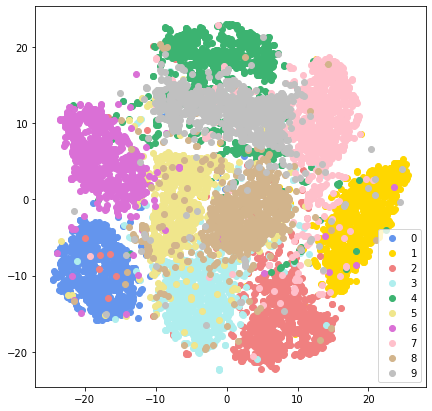

In [ ]:
# Custom Visualizations

labels = list(range(10))
plt.figure(figsize=(7,7))
colours = ['cornflowerblue', 'gold', 'lightcoral', 'paleturquoise', 
          'mediumseagreen', 'khaki', 'orchid', 'pink', 'tan', 'silver']
for label, c in zip(labels, colours):
    plt.scatter(z_embedded[test_labels == label, 0], 
                z_embedded[test_labels == label, 1], c=c, label=label)
plt.legend()
plt.title("Custom visualization of T-SNE based on the final model")
plt.show()

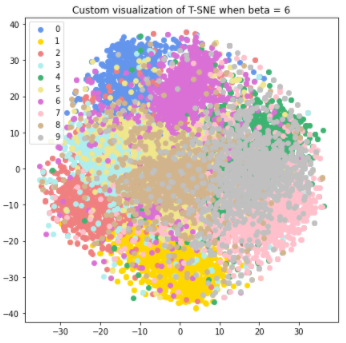

### Discussion
What do you observe? Discuss the structure of the visualized representations. 
* What do you observe? What role do the KL loss term and $\beta$ have, if any, in what you observe (multiple matplotlib plots may be desirable here)?
    * Consider Outliers
    * Counsider Boundaries
    * Consider Clusters
* Is T-SNE reliable? What happens if you change the parameters (don't worry about being particularly thorough). [This link](https://distill.pub/2016/misread-tsne/) may be helpful.

**YOUR ANSWER**

From the visualizations above, we can see that the final model managed to represent the data well in the latent space, clustering the data based on which digit (label) is represented by each data point. Further, the positioning of the clusters is intuitive, digits that look more similar tend to have clusters closer together, e.g. clusters for labels 1 and 7 are next to each other, while 1 and 0 are on opposite sides of the plot.

There is no significant overlap, and while there are some outliers, when ispecting the interactive plot, one can see that these are more often 'unusual' in shape, rather than mis-represented neatly written (or 'standard') digits.

Further, we can see that the representation has deviated from a standard normal distribution, as has already been suggested by the upward-sloping KLD loss in the previous section. In the bottom plot, which represents a model trained with the beta paramter equal to 6, we can see that the clusters are much less clearly separated, which is expected as the loss now favours more the distribution being close to standard normal.

While T-SNE is generally a useful tool to visualize high-dimensional data, it might be better to take the results with a grain of salt. The reasons being that the cluster shapes can differ wildly for different values of perplexity (e.g. the custer sizes are not representative), or even not show up in the visualization if the chosen perplexity is inappropriate. Even worse than that, there might be cases where T-SNE produces different resluts in different runs even if we keep the same parameters (though this does not seem to be the case here).

## Part 1.3b: Interpolating in $z$ (4 Points)
Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set. What do you observe regarding the transition from one digit to the other?


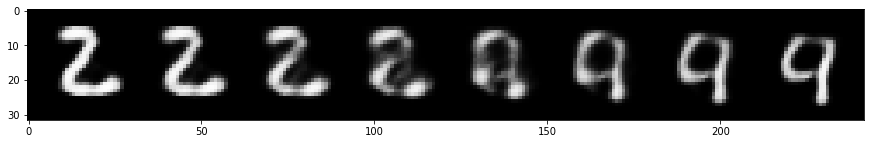

In [ ]:
# CODE FOR PART 1.3b IN THIS CELL

def plot_interpolation(a=2, b=4, steps=8):
  '''
  Takes three integers as input: a, b represent the two integers we want to
  interpolate and 'steps' gives the number of intermediate steps.
  '''
  # get data into required form
  data = loader_test.dataset.data.float()/200
  data = data.view(data.size(0), -1).to(device)

  # get an occurence of our desired digits in the data set
  data_labels = loader_test.dataset.targets.numpy()
  idx_a = torch.tensor(list(data_labels).index(a))
  idx_b = torch.tensor(list(data_labels).index(b))

  # encode both data points
  mu_a, logvar_a = model.encode(data[idx_a].flatten().to(device))
  mu_b, logvar_b = model.encode(data[idx_b].flatten().to(device))

  # get the corresponding latent vector z for both data points
  z_a = model.reparametrize(mu_a, logvar_a)
  z_b = model.reparametrize(mu_b, logvar_b)

  # create n intermediate values (steps)
  intermed_pts = torch.linspace(0, 1, steps).to(device)

  with torch.no_grad():
    # decode n linear combinations of vectors z_a and z_b
    interpolate = model.decode(intermed_pts.view(-1, 1) * z_b.view(1,-1) + 
                                (1-intermed_pts.view(-1, 1))* z_a.view(1,-1))
    # transform decoded vectors into the required shape so they can be plotted
    interpolate = interpolate.view(denorm(interpolate).size(0), -1, 28, 28)
    interpolation = make_grid(interpolate, nrow=steps)
    plt.figure(figsize = (15,10))
    show(interpolation)

plot_interpolation(2, 4, 8)

### Discussion
What did you observe in the interpolation? Is this what you expected?
* Can you relate the interpolation to your T-SNE visualization

**YOUR ANSWER**

The above plots shows a transition between two digits over a chosen number of steps. This can help us understand the latent space structure. Note that the intermediate images before the image fully transitions into a '4' resemble the digit '9'. Looking at the T-SNE visualization above, we can see that the cluster for data labelled as '9' also lies between the clusters for '2' and '4'. The images in the middle also illustrate that the latent space is not perfectly continuous, i.e. that some regions do not represent any specific digit (in the T-SNE plot, we can observe these as white areas).

For a very low value of beta (i.e. a model that favours reconstruction over generation quality), we would expect good quality images on the two ends of the transition, but more 'random' images that do not resemble written digits in between. On the other hand, for a very high beta, we might encounter a transition that is not very smooth, perhaps even one that depicts unrelated digits 'on the way'.

# Part 2 - Deep Convolutional GAN

In this task, your main objective is to train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. You should experiment with different architectures, tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end, you should provide us with: 

- your best trained model (which we will be able to run), 
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$ we have provided you with (train for a number of epochs and make sure there is no mode collapse), 
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explain whether your produced plots are theoretically sensible and why this is (or not) the case. 
- a discussion on whether you noticed any mode collapse, where this behaviour may be attributed to, and explanations of what you did in order to cope with mode collapse. 

## Part 2.1 (30 points)
**Your Task**: 

a. Implement the DCGAN architecture. 

b. Define a loss and implement the Training Loop

c. Visualize images sampled from your best model's generator ("Extension" Assessed on quality)

d. Discuss the experimentations which led to your final architecture. You can plot losses or generated results by other architectures that you tested to back your arguments (but this is not necessary to get full marks).


_Clarification: You should not be worrying too much about getting an "optimal" performance on your trained GAN. We want you to demonstrate to us that you experimented with different types of DCGAN variations, report what difficulties transpired throughout the training process, etc. In other words, if we see that you provided us with a running implementation, that you detail different experimentations that you did before providing us with your best one, and that you have grapsed the concepts, you can still get good marks. The attached model does not have to be perfect, and the extension marks for performance are only worth 10 points._

In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt


def denorm(x, channels=None, w=None ,h=None, resize = False):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists('/content/drive/MyDrive/icl_dl_cw2/CW_GAN'):
    os.makedirs('/content/drive/MyDrive/icl_dl_cw2/CW_GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

Using cuda


### Part 2.1a: Implement DCGAN (8 Points)
Fill in the missing parts in the cells below in order to complete the Generator and Discriminator classes. You will need to define:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`

Recomendations for experimentation:
- use the architecture that you implemented for the Autoencoder of Part 1 (encoder as discriminator, decoder as generator).
- use the architecture desribed in the DCGAN paper (https://arxiv.org/abs/1511.06434).

Some general reccomendations:
- add several convolutional layers (3-4).
- accelerate training with batch normalization after every convolutional layer.
- use the appropriate activation functions. 
- Generator module: the upsampling can be done with various methods, such as nearest neighbor upsampling (`torch.nn.Upsample`) or transposed convolutions(`torch.nn.ConvTranspose2d`). 
- Discriminator module: Experiment with batch normalization (`torch.nn.BatchNorm2d`) and leaky relu (`torch.nn.LeakyReLu`) units after each convolutional layer.

Try to follow the common practices for CNNs (e.g small receptive fields, max pooling, RELU activations), in order to narrow down your possible choices.

<font color="red">**Your model should not have more than 25 Million Parameters**</font>

The number of epochs that will be needed in order to train the network will vary depending on your choices. As an advice, we recommend that while experimenting you should allow around 20 epochs and if the loss doesn't sufficiently drop, restart the training with a more powerful architecture. You don't need to train the network to an extreme if you don't have the time.

#### Data loading

In [ ]:
batch_size = 128   # used in DCGAN paper
image_size = 32

transform = transforms.Compose([
     transforms.Resize(image_size),                                                  
     transforms.ToTensor(),
     transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5),),                        
])

data_dir = './datasets'

cifar10_train = datasets.CIFAR10(data_dir, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_dir, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

Extracting ./datasets/cifar-10-python.tar.gz to ./datasets
Files already downloaded and verified


We'll visualize a subset of the test set: 

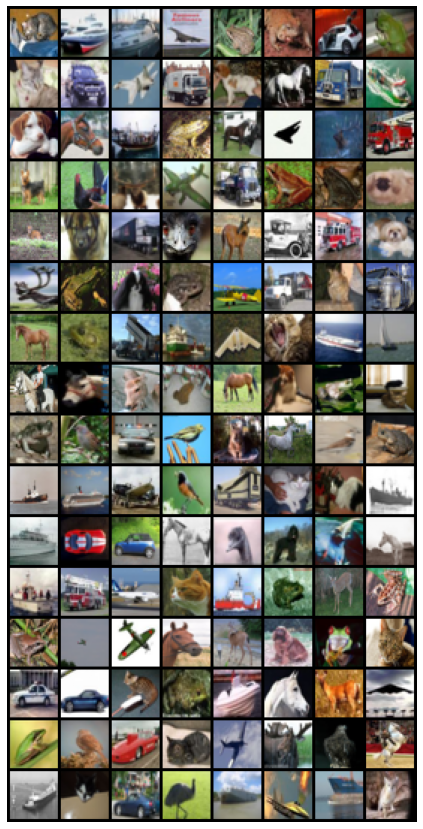

In [ ]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

In [ ]:
# *CODE FOR PART 2.1 IN THIS CELL*

# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.

num_epochs = 50
learning_rate = 0.0002  #DCGAN paper uses this
latent_vector_size = 24 

# Other hyperparams

n_channels = 3 #for RGB images
beta1 = 0.5 #for Adam optimizer, as used in the DCGAN paper

gen_fm_size = 32
dis_fm_size = 32


In [ ]:
# *CODE FOR PART 2.1 IN THIS CELL*

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.main =  nn.Sequential(
            # Input layer
            nn.ConvTranspose2d(in_channels = latent_vector_size, 
                               out_channels = gen_fm_size * 8, kernel_size = 4,
                               bias=False),
            nn.BatchNorm2d(num_features = gen_fm_size * 8),
            nn.LeakyReLU(negative_slope = 0.2, inplace=True),

            # First hidden layer
            nn.ConvTranspose2d(in_channels = gen_fm_size * 8, 
                               out_channels = gen_fm_size * 4, kernel_size = 4, 
                               stride = 2, padding = 1, bias = False),
            nn.BatchNorm2d(num_features = gen_fm_size * 4),
            nn.LeakyReLU(negative_slope = 0.2, inplace=True),

            # Second hidden layer
            nn.ConvTranspose2d(in_channels = gen_fm_size * 4, 
                               out_channels = gen_fm_size * 2, kernel_size = 4, 
                               stride = 2, padding = 1, bias = False),
            nn.BatchNorm2d(num_features = gen_fm_size * 2),
            nn.LeakyReLU(negative_slope = 0.2, inplace=True),

            # And finally, the output layer - this time we use Tanh activation,
            # not ReLU
            nn.ConvTranspose2d(in_channels = gen_fm_size * 2, 
                               out_channels = n_channels, kernel_size = 4, 
                               stride = 2, padding  = 1, bias = False),
            nn.Tanh()
            )
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 


    def forward(self, z, label=None):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.main(z)
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################
        return out


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.main = nn.Sequential(
            # Input layer
            nn.Conv2d(in_channels = n_channels, out_channels = dis_fm_size, 
                      kernel_size = 4, stride = 2, padding = 1, bias = False),
            nn.LeakyReLU(negative_slope = 0.2, inplace=True),
            
            # First hidden layer
            nn.Conv2d(in_channels = dis_fm_size, out_channels = dis_fm_size * 2, 
                      kernel_size = 4, stride = 2, padding = 1, bias = False),
            nn.BatchNorm2d(num_features = dis_fm_size * 2),
            nn.LeakyReLU(negative_slope = 0.2, inplace = True),
            
            # Second hidden layer
            nn.Conv2d(in_channels = dis_fm_size * 2, 
                      out_channels = dis_fm_size * 4, kernel_size = 4, 
                      stride = 2, padding = 1, bias = False),
            nn.BatchNorm2d(num_features = dis_fm_size * 4),
            nn.LeakyReLU(negative_slope = 0.2, inplace = True),

            # Third hidden layer
            nn.Conv2d(in_channels = dis_fm_size * 4, 
                      out_channels = dis_fm_size * 8, kernel_size = 4, 
                      stride = 2, padding = 1, bias = False),
            nn.BatchNorm2d(num_features = dis_fm_size * 8),
            nn.LeakyReLU(negative_slope = 0.2, inplace = True),

            # Output layer
            nn.Conv2d(in_channels = dis_fm_size * 8, out_channels = 1, 
                      kernel_size = 2, bias = False),
            nn.Sigmoid()
            )

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def forward(self, x, label=None):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.main(x)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
        return out


<h2> Initialize Model and print number of parameters </h2>

You can use method `weights_init` to initialize the weights of the Generator and Discriminator networks. Otherwise, implement your own initialization, or do not use at all. You will not be penalized for not using initialization.

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [ ]:
use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

Total number of parameters in Generator is: 757632
Generator(
  (main): Sequential(
    (0): ConvTranspose2d(24, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


Total number of parameters in Discriminator is: 691584
Discriminator(
  (main): Sequential(


### Part 2.1b: Training the Model (12 Points)

#### Defining a Loss

In [ ]:
def loss_function(out, label):
    loss = nn.BCELoss(reduction='mean')(out, label)
    return loss

<h3>Choose and initialize optimizers</h3>

In [ ]:
# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.

optimizerD = torch.optim.Adam(model_D.parameters(), lr=learning_rate, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(model_G.parameters(), lr=learning_rate, betas=(beta1, 0.999))

<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [ ]:
fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
# having real labels set to 1 and fake to 0 helps speed up the
real_label = 0 
fake_label = 1

#### Training Loop

In [ ]:
train_losses_G = []
train_losses_D = []

# i added this - needed?
avg_real_pred = [] # should go from 0 to 0.5
avg_fake_pred = [] # should go from 1 to 0.5

for epoch in range(num_epochs):
    train_loss_D = 0
    train_loss_G = 0
    for i, data in enumerate(loader_train, 0):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################device
        # train with real
        
        model_D.zero_grad()
        real_batch = data[0].to(device)
        r_batch_size = real_batch.size(0)
        r_labels = torch.full(size=(r_batch_size,), fill_value=real_label, dtype=torch.float, device=device)

        r_preds = model_D(real_batch).view(-1)
        #print(f"there are {r_preds.shape} real preds.")
        #print(f"there are {r_labels.shape} labels.")
        loss_real = loss_function(r_preds, r_labels)
        loss_real.backward()

        D_x = r_preds.mean().item()

        # train with fake
        random_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
        fake_batch = model_G(random_noise)
        f_batch_size = fake_batch.size(0)
        
        f_preds = model_D(fake_batch.detach()).view(-1)
        f_labels = torch.full(size=(f_preds.shape[0],), fill_value=fake_label, dtype=torch.float, device=device)
        #print(f"there are {f_preds.shape} fake preds.")
        #print(f"there are {f_labels.shape} labels.")

        loss_fake = loss_function(f_preds, f_labels)
        loss_fake.backward()

        D_G_z1 = f_preds.mean().item()

        D_loss = loss_fake + loss_real
        train_loss_D += D_loss.item()
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################

        model_G.zero_grad()
        preds = model_D(fake_batch).view(-1)
        r_labels = torch.full(size=(preds.shape[0],), fill_value=real_label, dtype=torch.float, device=device)
        G_loss = loss_function(preds, r_labels)
        G_loss.backward()
        train_loss_G += G_loss.item()

        D_G_z2 = preds.mean().item()

        optimizerG.step()

        print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
              % (epoch, num_epochs, i, len(loader_train),
                 D_loss.item(), G_loss.item(), D_x, D_G_z1, D_G_z2))

    if epoch == 0:
        save_image(denorm(real_batch.cpu()).float(), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/real_samples.png')
    with torch.no_grad():
        fake = model_G(fixed_noise)
        save_image(denorm(fake.cpu()).float(), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/fake_samples_epoch_%03d.png' % epoch)
    train_losses_D.append(train_loss_D/ len(loader_train))
    train_losses_G.append(train_loss_G / len(loader_train))
   
    
# save  models 
# if your discriminator/generator are conditional you'll want to change the inputs here
torch.jit.save(torch.jit.trace(model_G, (fixed_noise)), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_G_model.pth')
torch.jit.save(torch.jit.trace(model_D, (fake)), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_D_model.pth')



Streaming output truncated to the last 5000 lines.
[37/50][83/391] Loss_D: 0.2311 Loss_G: 2.9734 D(x): 0.1274 D(G(z)): 0.9229 / 0.9239
[37/50][84/391] Loss_D: 0.2031 Loss_G: 3.1409 D(x): 0.0792 D(G(z)): 0.8950 / 0.9373
[37/50][85/391] Loss_D: 0.2744 Loss_G: 2.7058 D(x): 0.1447 D(G(z)): 0.9043 / 0.8997
[37/50][86/391] Loss_D: 0.3095 Loss_G: 4.0639 D(x): 0.0449 D(G(z)): 0.7899 / 0.9737
[37/50][87/391] Loss_D: 0.2011 Loss_G: 3.8500 D(x): 0.1446 D(G(z)): 0.9673 / 0.9634
[37/50][88/391] Loss_D: 0.4185 Loss_G: 1.7515 D(x): 0.2427 D(G(z)): 0.9026 / 0.7781
[37/50][89/391] Loss_D: 0.5116 Loss_G: 4.1112 D(x): 0.0343 D(G(z)): 0.6627 / 0.9760
[37/50][90/391] Loss_D: 0.2511 Loss_G: 4.3774 D(x): 0.1179 D(G(z)): 0.9010 / 0.9782
[37/50][91/391] Loss_D: 0.4316 Loss_G: 1.9497 D(x): 0.3047 D(G(z)): 0.9749 / 0.8002
[37/50][92/391] Loss_D: 0.5620 Loss_G: 4.4378 D(x): 0.0515 D(G(z)): 0.6469 / 0.9812
[37/50][93/391] Loss_D: 0.6789 Loss_G: 1.8463 D(x): 0.4301 D(G(z)): 0.9727 / 0.7722
[37/50][94/391] Loss_D: 0

## Part 2.1c: Results (10 Points)
This part is fairly open-ended, but not worth too much so do not go crazy. The table below shows examples of what are considered good samples. Level 3 and above will get you 10/10 points, level 2 will roughly get you 5/10 points and level 1 and below will get you 0/10 points.

<table><tr>
<td> 
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1wQ2f10-A1Vs7k0LMfBPPyYTsPlkBF9QE" width="%30">
    <br>
    <em style="color: grey">Level 1</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1wlDhX4hROET4s8Ndxn8nhj_0RLM2rnuG" width="%30">
    <br>
    <em style="color: grey">Level 2</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1w9VrgfJLCRaTPhwoFVYdYhtCeaQmFHGb" width="%30">
    <br>
    <em style="color: grey">Level 3</em>
  </p> 
</td>
</tr></table>

### Generator samples

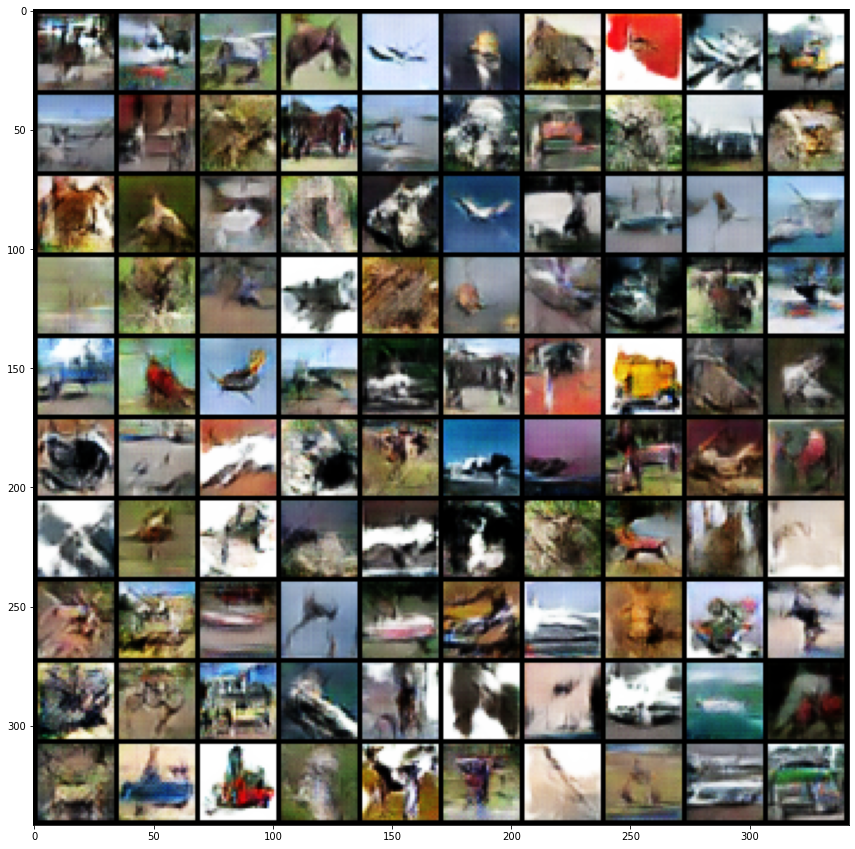

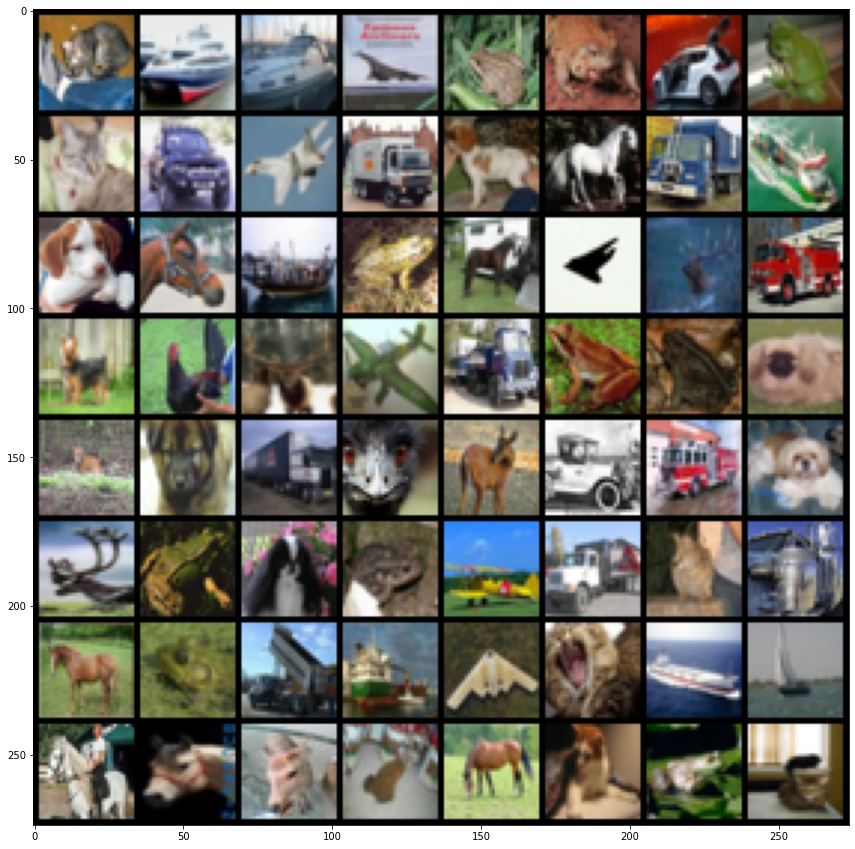

In [ ]:
input_noise = torch.randn(100, latent_vector_size, 1, 1, device=device)
with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise).cpu()
    generated = make_grid(denorm(generated)[:100], nrow=10, padding=2, normalize=False, 
                        range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(15,15))
    save_image(generated,'/content/drive/MyDrive/icl_dl_cw2/CW_GAN/Teaching30final.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
show(img)

## Part 2.1d: Engineering Choices (10 Points)

Discuss the process you took to arrive at your final architecture. This should include:

* Which empirically useful methods did you utilize
* What didn't work, what worked and what mattered most
* Are there any tricks you came across in the literature etc. which you suspect would be helpful here

**Your Answer**

I started by following the architecture from the DCGAN paper, which proved to be a good choice overall. For example, deviating from the values proposed in the paper for batch size, learning rate and beta1 parameter (for the Adam optimizer) or different optimizers never led to better performance, and in case of small learning rate values even caused mode collapse. The final architecture consists of four transpose convolutional layers in the Generator, with LeakyReLU and BatchNorm applied after each layer except the output layer, which has no BatchNorm and Tanh as activation function. Further, there are five convolutional layers in the Discriminator, with ReLU activation (except the output layer, which has the Sigmoid activation function) and BatchNorm applied to all hidden layers.

One of the parameters with the most influence on the quality of the generated images was the latent space dimension. First, it was found that too small values cause mode collapse. Additionally, in Part 1 of the coursework, a latent space of 16 dimensions worked well, and since CIFAR-10 images are more complex and more diverse than MNIST digit images, it seemed reasonable to think that in this case the latent space dimension would need to be higher. Thus, 16 was set as a lower bound for further experiments and mainly values between 16 and 32 were considered. Values around 16 indeed resulted in rather poor quality of the generated images. Specifically, some images looked alright (comparable with the ones generated by the final network), but others were just white, grey or brown squares with little to no structure or detail. On the other hand, a latent space with 32 dimensions yielded images with more interesting content, but the images were blurred or pixelized. Longer trainin time was tried (50 epochs instead of 20), but there seemed to be little improvement. Finally, the best results have been obtained by choosing latent space of dimension 24 trained for 50 epochs.

An empirically useful method that did indeed have high impact on the model quality was switching labels for real and fake classes, i.e. use 0 for real images and 1 for fake ones. Without this step, the discriminator loss started dropping sharply after a few epochs, the network did not learn properly, and the training process resulted in very poor quality images being generated. Switching the labels results in a more convenient shape of the loss curve that makes it easier for the network to learn in the early iterations (since in the beginning, the quality of fake images produced by the generator is poor and it is easy for the discriminator to reject them with high confidence). Another empirically useful methods is implementing soft labels. This method replaces the 1, 0 labels by a random number close to 1 and 0 respectively when training the discriminator. However, the main purpose of this methods is to prevent mode collapse, which has not been a serious issue for the model to start with, so it did not lead to improvements and it was not implemented in the final model.

Further, adding BatchNorm after every convolutional layer (with the exception of the output layer in the Generator and both input & output layers in the Discriminator) and LeakyReLU in the Discriminator helped the model stabilise. These are both propposed in the DCGAN paper so they were implemented to start with, but they were removed as part of the exploration, and higher variance in the loss was observed and worse performance in general (notably more blurry images), which is probably given by a higher covariance shift in the absence of BatchNorm.




## Part 2.2: Understanding GAN Training (5 points)


### Loss Curves
**Your task:**


Plot the losses curves for the discriminator $D$ and the generator $G$ as the training progresses and explain whether the produced curves are theoretically sensible and why this is (or not) the case (x-axis: epochs, y-axis: loss).

Make sure that the version of the notebook you deliver includes these results.

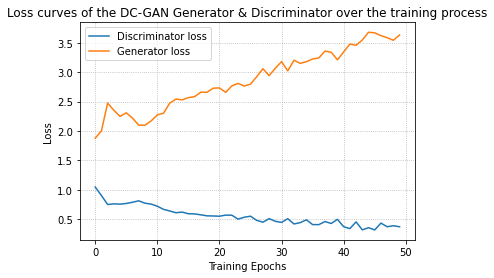

In [ ]:
# ANSWER FOR PART 2.2 IN THIS CELL*

train_losses_D = np.array(train_losses_D)
train_losses_G = np.array(train_losses_G)
x = list(range(num_epochs))

plt.plot(x, train_losses_D, label = "Discriminator loss")
plt.plot(x, train_losses_G, label = "Generator loss")
plt.legend()
plt.xlabel("Training Epochs")
plt.ylabel("Loss")
plt.title("Loss curves of the DC-GAN Generator & Discriminator over the training process")
plt.grid(True, which="major", linestyle="dotted")
plt.show()

### Discussion

Do your loss curves look sensible? What would you expect to see and why?




**YOUR ANSWER**

We would expect the Generator loss decrease over time, as it gets better at generating convincing images and fooling the Discriminator. Similarly, the Discriminator loss should grow as it becomes less confident. In an ideal scenario, the Discriminator loss shall approach 0.5 (i.e. it should only guess the correct answer with 50% chance).

However, we can see that this is not the case, despite the generator learning to produce reasonably good images, its loss grows and the curve does not coverge. We also cannot say that the loss curves have stabilised.
It looks like the discriminator has become stronger over time than the generator and despite the generator improving, it cannot fool the discriminator.
By researching the issue I found some recommended methods to cope with this issue, of of them being label smoothing (to make the discriminator less confident). However, this did not solve the issue (and so label smoothing was removed from the final model. Anoether possible way to address this would be to try adding noise to discriminator inputs, though this has not been done due to time constraints.

## Part 2.3: Understanding Mode Collapse (5 points) 
**Your task:** 

Based on the images created by your generator using the `fixed_noise` vector during training, provide a discussion on whether you noticed any mode collapse, what this behaviour may be attributed to, and explain what you did in order to cope with mode collapse.

### Discussion







**YOUR ANSWER**

The images generated using the fixed_noise vector are diverse and do not seem to repeat. Mode collapse has not been as much of an issue as I anticipated, which might have been because I followed the architecture proposed in the DCGAN paper quite closely.

However, mode collapse has ocurred during hyperparameter tuning and experimenting with architecture choices. It seemed to be linked mainly to the size of the latent space (mode collapse would occur when the latent space dimension is selected to be very small). One of the methods proposed to prevent mode collapse is label smoothing, which consists in assigning labels close to 1 instead of exactly 1 (e.g. a random number between 0.9 and 1) to one class and similarly numbers close to zero for the second class. However, this has not proved to be too helpful in this setting. Further, increasing the learning rate could help the discriminator escape local minima, but the learning rate used in the DCGAN paper seemed to yield the best model performace. Thus, to avoid mode collapse, an appropriate latent space size has been selected. 

However, in case the issue would have persisted, some of the proposed solutions are implementing the Wasserstein loss function [1], which prevents the discriminator from getting stuck in a local minimum, or a loss function implemented in Unrolled GANs [2], which focuses on preventing the generator from optimizing too much for a specific discriminator.

[1] Arjovsky, Chintala & Bottou, 2017, Wasserstain GAN https://arxiv.org/abs/1701.07875 \\
[2] L. Metz et al, 2017, Unrolled GANs https://arxiv.org/pdf/1611.02163.pdf



# TA Test Cell
TAs will run this cell to ensure that your results are reproducible, and that your models have been defined suitably. 

<font color="blue"> <b> Please provide the input and output transformations required to make your VAE and GANs work. If your GAN generator requires more than just noise as input, also specify this below (there are two marked cells for you to inspect) </b></font>


In [ ]:
# If you want to run these tests yourself, change directory:

!cd /content/drive/MyDrive/icl_dl_cw2/

In [ ]:
!pip install -q torch torchvision

In [ ]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt 

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [ ]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
])

def vae_denorm(x):
    return x


def gan_denorm(x, channels=None, w=None ,h=None, resize = False):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

gan_latent_size = 24

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [ ]:
# Load VAE Dataset
test_dat = datasets.MNIST("./data/", train=False, transform=vae_transform, 
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)


In [ ]:
############# MODIFY IF NEEDED #############
vae_input, _ = next(iter(vae_loader_test))

# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(100, gan_latent_size, 1, 1, device=device)
gan_input = [input_noise] # In case you want to provide a tuple, we wrap ours

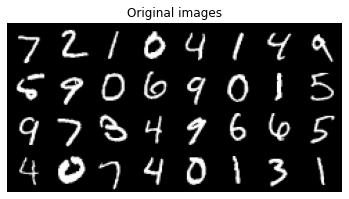

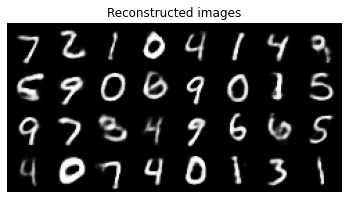

In [ ]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""

vae = torch.jit.load('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/VAE_model.pth')
vae.eval()

# Check if VAE is convolutional

for module in vae.children():
    for layer in module.children():
        if "Conv2d" in layer.original_name:
            print("Used Convs")
            break

vae_in = make_grid(vae_denorm(vae_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.title('Original images')
plt.axis('off')
show(vae_in)

vae_test = model(vae_input.view(vae_input.size(0),-1).to(device))[0].detach()
vae_test =vae_test.view(vae_input.size(0), -1, 28, 28)

vae_reco = make_grid(vae_denorm(vae_test), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.title('Reconstructed images')
plt.axis('off')
show(vae_reco)

Number of Parameters is 1449216 which is ok


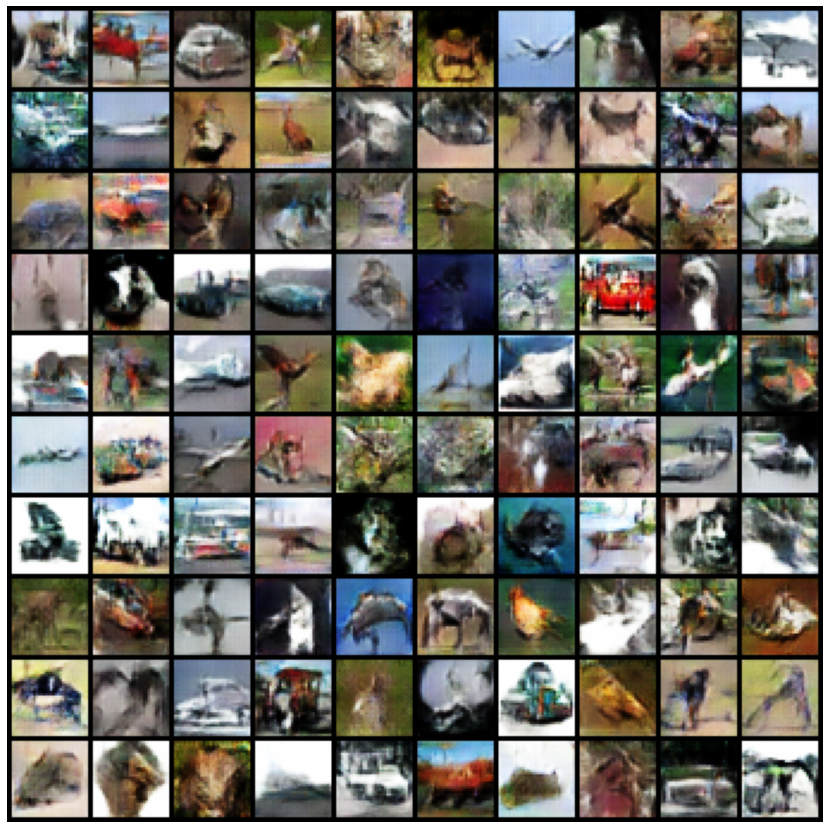

In [ ]:
# GAN Tests
model_G = torch.jit.load('/content/drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_G_model.pth')
model_D = torch.jit.load('/content/drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]  

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100].detach(), nrow=10, padding=2, normalize=False, 
                    range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
plt.axis('off')
show(generated)